In [1]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import LinearSegmentedColormap, Normalize
import geopandas as gpd
import pandas as pd
import osmnx as ox
import contextily as ctx
import folium
import pydeck as pdk
from folium.plugins import MarkerCluster
from dotenv import load_dotenv
import os
import requests
import json

In [2]:
# Remove all axis tick labels and tick marks from the given axis
def ax_ticks_off(ax):
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    ax.tick_params(axis= 'both', which= 'both', length=0)

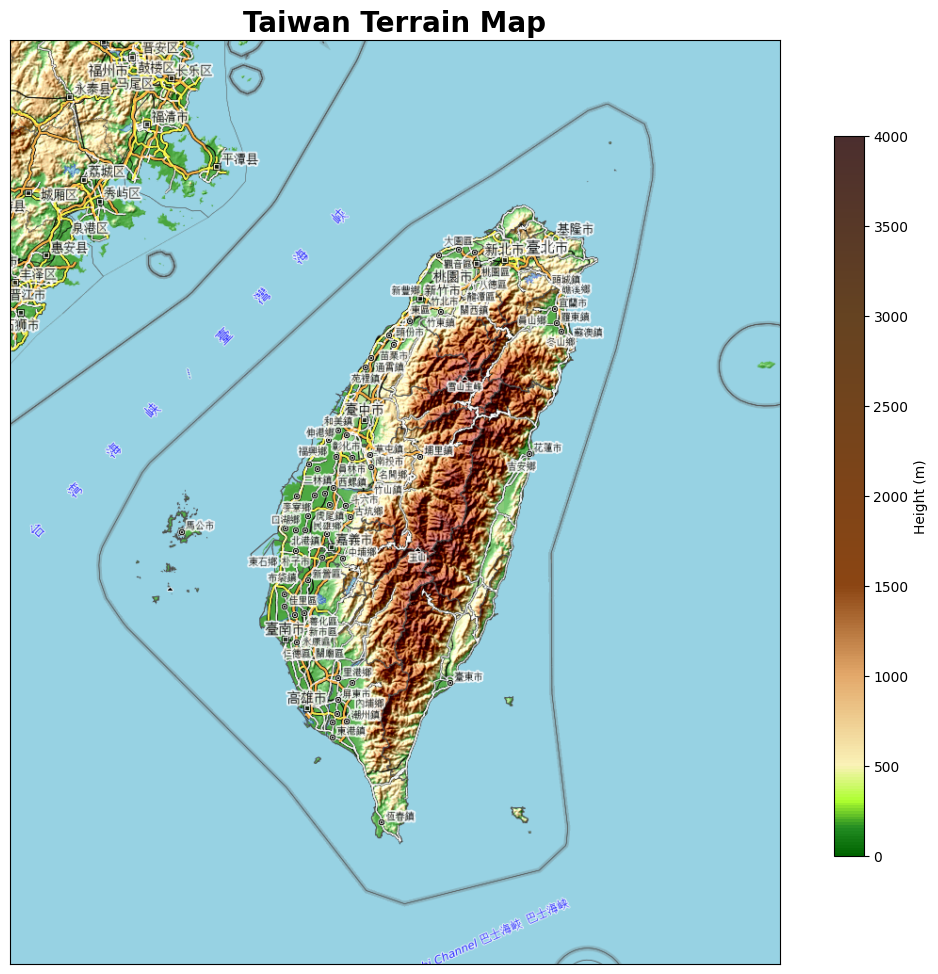

In [3]:
# Geocode Taiwan and retrieve its geographical data as a GeoDataFrame
taiwan = ox.geocode_to_gdf("Taiwan")
# Convert the coordinate reference system (CRS) to Web Mercator (EPSG:3857) 
taiwan = taiwan.to_crs(epsg=3857)

# Custom terrain colour mapping (based on 0~4000m elevation distribution)
elevation_colors = LinearSegmentedColormap.from_list("elevation", [
    (0.0, "#006400"),   # 0m - Dark green
    (0.0375, "#228B22"), # 150m - Green
    (0.075, "#ADFF2F"), # 300m - Yellow-green
    (0.125, "#FAF2B7"), # 500m - Light yellow
    (0.25, "#E3A86A"),  # 1000m - Light brown
    (0.375, "#8B4513"), # 1500m - Reddish brown
    (0.75, "#654321"),  # 3000m - Dark brown
    (1.0, "#4B2E2E")    # 4000m - Deep brown
])

# Create the figure
fig, ax = plt.subplots(figsize=(15, 12))

# Plot Taiwan map
taiwan.plot(ax=ax, alpha=0, color="lightblue", edgecolor="black")

# Set map extent (Web Mercator projection units)
ax.set_xlim([1.32e7, 1.37e7])  # Longitude range
ax.set_ylim([2.42e6, 3.02e6])  # Latitude range

# Add basemap
ctx.add_basemap(ax, source=ctx.providers.OpenTopoMap, attribution=False)

# Add colour bar (independent, does not affect map)
fig.subplots_adjust(right=1.05)  # Adjust figure position to make space on the right
cbar_ax = fig.add_axes([0.88, 0.2, 0.02, 0.6])  # Colour bar position [left, bottom, width, height]

# Define normalisation range 0~4000m
norm = Normalize(vmin=0, vmax=4000)

# Plot colour bar
cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=elevation_colors), cax=cbar_ax)
cb.set_label("Height (m)")

# Set title
ax.set_title("Taiwan Terrain Map", fontsize=20, fontweight='bold')

# Remove coordinate axis ticks
ax_ticks_off(ax)

# Display the map
plt.show()

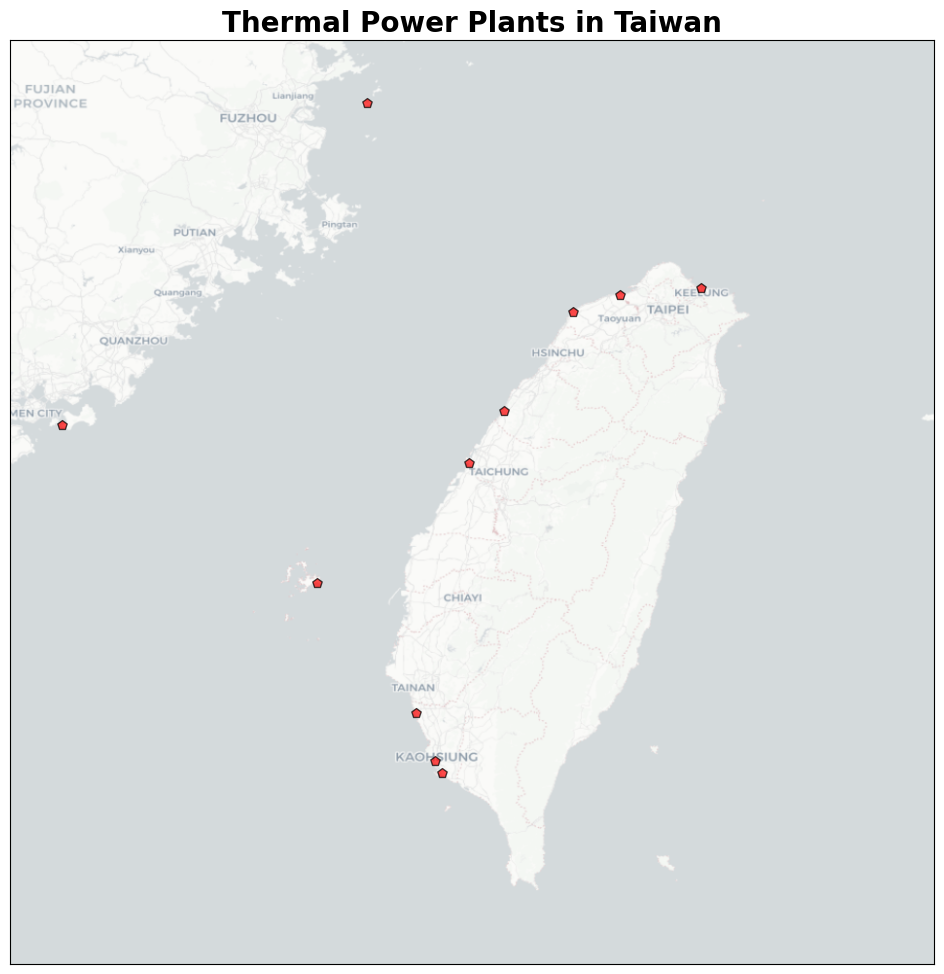

In [4]:
# Convert thermal power plant data to a GeoDataFrame using WGS84 (EPSG:4326)
wgs = "EPSG:4326"
# Source: https://data.gov.tw/dataset/8934
power_plants = pd.read_json('data/thermal_power_plants.json')
gdf = gpd.GeoDataFrame(power_plants, geometry=gpd.points_from_xy(power_plants.longitude, power_plants.latitude), crs=wgs)

# Create the figure
fig, ax = plt.subplots(figsize=(15, 12))

# Plot the power plant locations
gdf.plot(ax=ax, color='red', marker='p', markersize=50, alpha=0.7, edgecolor='black')

ax.set_xlim(118, 123)  # Longitude range (extend eastwards)
ax.set_ylim(21.5, 26.5)  # Latitude range (extend southwards)

# Add basemap
ctx.add_basemap(ax, crs=gdf.crs, source=ctx.providers.CartoDB.Positron, attribution=False)

# Set title
ax.set_title("Thermal Power Plants in Taiwan", fontsize=20, fontweight='bold')

# Remove coordinate axis ticks
ax_ticks_off(ax)

# Display the map
plt.show()

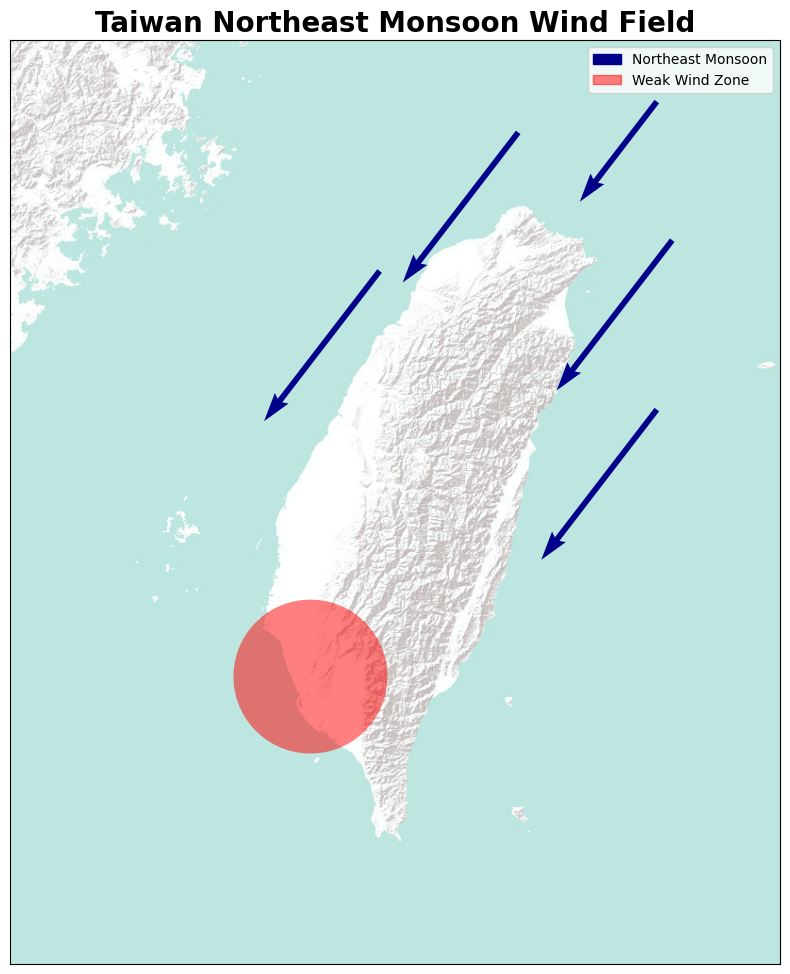

In [5]:
# Location of the southern region (latitude and longitude)
southern_lat, southern_lon = 22.79, 120.33 

# Create a GeoDataFrame to represent Tainan's location and convert to Web Mercator projection
southern_gdf = gpd.GeoDataFrame({"name": ["Tainan"]}, geometry=gpd.points_from_xy([southern_lon], [southern_lat]), crs="EPSG:4326").to_crs(epsg=3857)

# Create an elliptical area (using buffer)
southern_gdf["geometry"] = southern_gdf.geometry.buffer(50000, cap_style='round')  # cap_style='round' makes it elliptical

# Plot Taiwan map
fig, ax = plt.subplots(figsize=(15, 12))
taiwan.plot(ax=ax, alpha=0, color="lightblue", edgecolor="black")

# Manually set the longitude and latitude display range (in Web Mercator projection units)
ax.set_xlim([1.32e7, 1.37e7])  # Restrict east-west longitude
ax.set_ylim([2.42e6, 3.02e6])  # Restrict north-south latitude

# Add basemap
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldTerrain, attribution=False)

# Northeast monsoon (blowing from northeast to southwest)
monsoon_x = [1.362e7, 1.353e7, 1.344e7, 1.363e7, 1.362e7]  # Starting longitude
monsoon_y = [2.98e6, 2.96e6, 2.87e6, 2.89e6, 2.78e6]  # Starting latitude
monsoon_u = [-100000, -150000, -150000, -150000, -150000]  # East-west wind component (westward)
monsoon_v = [-130000, -195000, -195000, -195000, -195000]  # North-south wind component (southward)

# Plot arrows (wind field)
ax.quiver(monsoon_x, monsoon_y, monsoon_u, monsoon_v, color='darkblue', scale=1e6, label='Northeast Monsoon')

# Plot the southern region (elliptical area)
southern_gdf.plot(ax=ax, color="red", alpha=0.5, label="Tainan")

# Manually add legend
monsoon_patch = mpatches.Patch(color='darkblue', label='Northeast Monsoon')
southern_patch = mpatches.Patch(color='red', alpha=0.5, label='Weak Wind Zone')
plt.legend(handles=[monsoon_patch, southern_patch])

ax.set_title("Taiwan Northeast Monsoon Wind Field", fontsize=20, fontweight='bold')


ax_ticks_off(ax)

plt.show()

# Map of Taiwan’s Most Polluted PM2.5 Areas

In [6]:
# Create a map centred on Taichung city
high_polluted_map = folium.Map(location=[24.1630, 120.6746], zoom_start=7)

# API request (using the Taiwan's Ministry of Environment open data API to obtain air quality data)
env_path = os.path.join(os.getcwd(), '.env')
load_dotenv(dotenv_path=env_path)
moenv_token = os.getenv('MOENV_TOKEN')
response = requests.get(f'https://data.moenv.gov.tw/api/v2/aqx_p_432?language=en&offset=0&limit=100&api_key={moenv_token}&format=json')
api_data = response.json()

# Parse API data
air_quality_data = api_data.get("records", [])

# Create DataFrame
df = pd.DataFrame(air_quality_data)
df["pm2.5"] = pd.to_numeric(df["pm2.5"], errors="coerce")  # Convert PM2.5 values to numeric format

# Select the top 20% of locations with the highest PM2.5 concentration
threshold = df["pm2.5"].quantile(0.8)
high_pollution_df = df[df["pm2.5"] >= threshold]

# Add markers to the map
marker_cluster = MarkerCluster().add_to(high_polluted_map)

for index, row in high_pollution_df.iterrows():
    folium.Marker(
        location=[float(row["latitude"]), float(row["longitude"])],
        popup=f"Station: {row['sitename']}\nPM2.5: {row['pm2.5']} µg/m³",
        tooltip=row['sitename'],
        icon=folium.Icon(color='red', icon='warning', prefix='fa')
    ).add_to(marker_cluster)

high_polluted_map

# Taiwan Nighttime Light Map

In [7]:
# Load g0v Taiwan county GeoJSON
tw_county = gpd.read_file('https://raw.githubusercontent.com/g0v/twgeojson/refs/heads/master/json/twCounty2010.geo.json')

# Create Folium map centered on Taiwan
nighttime_light_map = folium.Map(location=(23.7, 121.0), zoom_start=8, tiles="NASAGIBS.ViirsEarthAtNight2012")

# Add county boundaries with glowing yellow borders
folium.GeoJson(
    tw_county.__geo_interface__,
    style_function=lambda feature: {
        'color': '#FFFF00',
        'weight': 1,
        'fillOpacity': 0
    },
    tooltip=folium.GeoJsonTooltip(fields=['COUNTYNAME'], aliases=['County:'])
).add_to(nighttime_light_map)

nighttime_light_map 

# 3D Building Map of Taiwan

In [8]:
# Load Mapbox token from environment variables
mapbox_token = os.getenv('MAPBOX_TOKEN')

# Define view state centered on Taipei City
view_state = pdk.ViewState(
    longitude=121.56,
    latitude=25.05,
    zoom=15,
    pitch=60,
    bearing=0
)

# Create Pydeck map using a custom Mapbox style (self-designed)
deck = pdk.Deck(
    # No layers added; display custom 3D Mapbox buildings only
    layers=[],
    initial_view_state=view_state,
    # My custom Mapbox style URL
    map_style="mapbox://styles/bolin0330/cm8l2zoch00v801qsdoy1bvhg",
    map_provider="mapbox",
    api_keys={"mapbox": f'{mapbox_token}'}
)

deck.show()